In [1]:
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
pd.pandas.set_option('display.max_columns',None)
from xgboost import XGBRegressor, DMatrix
import xgboost as xgb
import numpy as np
import seaborn as sns
#from sklearn.model_selection import train_test_split

# Read the data
X = pd.read_csv('../input/house-prices-advanced-regression-techniques/train.csv', index_col='Id')
X_test_full = pd.read_csv('../input/house-prices-advanced-regression-techniques/test.csv', index_col='Id')

# Remove rows with missing target, separate target from predictors
#X.dropna(axis=0, subset=['SalePrice'], inplace=True)
#y = X.SalePrice              
X["SalePrice"] = np.log1p(X["SalePrice"])
y = X.SalePrice.reset_index(drop=True)
X.drop(['SalePrice'], axis=1, inplace=True)

In [3]:
display(X.isnull().sum().sort_values(ascending=False)[:6])
X_test_full.isnull().sum().sort_values(ascending=False)[:6]

PoolQC         1453
MiscFeature    1406
Alley          1369
Fence          1179
FireplaceQu     690
LotFrontage     259
dtype: int64

PoolQC         1456
MiscFeature    1408
Alley          1352
Fence          1169
FireplaceQu     730
LotFrontage     227
dtype: int64

In [4]:
train_features = X.copy()
test_features = X_test_full.copy()

In [5]:
features = pd.concat([train_features, test_features]).reset_index(drop=True)
print(features.shape)

(2919, 79)


In [6]:
features.isnull().sum().sort_values(ascending=False)[:10]

PoolQC          2909
MiscFeature     2814
Alley           2721
Fence           2348
FireplaceQu     1420
LotFrontage      486
GarageCond       159
GarageQual       159
GarageYrBlt      159
GarageFinish     159
dtype: int64

In [7]:
none = ['Alley', 'PoolQC', 'MiscFeature', 'Fence', 'GarageType','MasVnrType']
for col in none:
    features[col].replace(np.nan, 'None', inplace=True)

In [8]:
features['MSSubClass'] = features['MSSubClass'].astype(str)
features['MoSold'] = features['MoSold'].astype(str)

In [9]:
features['MSZoning'] = features.groupby('MSSubClass')['MSZoning'].transform(
    lambda x: x.fillna(x.mode()[0]))

In [10]:
l = ['GarageQual', 'GarageCond', 'FireplaceQu', 'KitchenQual', 'HeatingQC', 'BsmtCond', 'BsmtQual', 'ExterCond', 'ExterQual']
for f in l:
    features[f] = features[f].replace({'Ex':5, 'Gd':4, 'TA':3, 'Fa':2, 'Po':1, 'NA':0})
features['BsmtExposure'] = features['BsmtExposure'].replace({'Gd':4, 'Av':3, 'Mn':2, 'No':1, 'NA':0})
features['GarageFinish'] = features['GarageFinish'].replace({'Fin':3, 'RFn':2, 'Unf':1, 'NA':0})
b = ['BsmtFinType1', 'BsmtFinType2']
for f in b:
    features[f] = features[f].replace({'GLQ':6, 'ALQ':5, 'BLQ':4, 'Rec':3, 'LwQ':2, 'Unf':1, 'NA':0})

In [11]:
map1 = {'Typ': 3, 'Min1': 2.5, 'Min2': 2, 'Mod': 1.5, 'Maj1': 1, 'Maj2': 0.5, 'Sev': 0, 'Sal': 0}
features['Functional'] = features['Functional'].replace(map1)
features['CentralAir'] = features['CentralAir'].replace({'Y':1, 'N':0})

In [12]:
freq_cols = [
    'Electrical', 'Exterior1st', 'Exterior2nd',
    'SaleType', 'Utilities'
]
for col in freq_cols:
    features[col].replace(np.nan, features[col].mode()[0], inplace=True)

In [13]:
features.isnull().sum().sort_values(ascending=True)[-22:]

KitchenQual        1
TotalBsmtSF        1
BsmtFinSF2         1
BsmtFinSF1         1
GarageCars         1
GarageArea         1
BsmtUnfSF          1
Functional         2
BsmtHalfBath       2
BsmtFullBath       2
MasVnrArea        23
BsmtFinType1      79
BsmtFinType2      80
BsmtQual          81
BsmtExposure      82
BsmtCond          82
GarageQual       159
GarageFinish     159
GarageYrBlt      159
GarageCond       159
LotFrontage      486
FireplaceQu     1420
dtype: int64

In [15]:
features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2919 entries, 0 to 2918
Data columns (total 79 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MSSubClass     2919 non-null   object 
 1   MSZoning       2919 non-null   object 
 2   LotFrontage    2433 non-null   float64
 3   LotArea        2919 non-null   int64  
 4   Street         2919 non-null   object 
 5   Alley          2919 non-null   object 
 6   LotShape       2919 non-null   object 
 7   LandContour    2919 non-null   object 
 8   Utilities      2919 non-null   object 
 9   LotConfig      2919 non-null   object 
 10  LandSlope      2919 non-null   object 
 11  Neighborhood   2919 non-null   object 
 12  Condition1     2919 non-null   object 
 13  Condition2     2919 non-null   object 
 14  BldgType       2919 non-null   object 
 15  HouseStyle     2919 non-null   object 
 16  OverallQual    2919 non-null   int64  
 17  OverallCond    2919 non-null   int64  
 18  YearBuil

In [19]:
cat_cols = [cname for cname in features.columns if  features[cname].dtype == "object"]
cat_cols
train = features.iloc[:1460]
test = features.iloc[1460:]

In [23]:
from category_encoders import CatBoostEncoder
cbe = CatBoostEncoder()
train[cat_cols] = cbe.fit_transform(train[cat_cols], y)
test[cat_cols] = cbe.transform(test[cat_cols])

In [26]:
with_missing = pd.concat([train, test]).reset_index(drop=True)
with_missing

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,12.024057,12.024057,65.0,8450,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,7,5,2003,2003,12.024057,12.024057,12.024057,12.024057,12.024057,196.0,4,3,12.024057,4.0,3.0,1.0,6.0,706.0,1.0,0.0,150.0,856.0,12.024057,5,1,12.024057,856,854,0,1710,1.0,0.0,2,1,3,1,4.0,8,3.0,0,NaN,12.024057,2003.0,2.0,2.0,548.0,3.0,3.0,12.024057,0,61,0,0,0,0,12.024057,12.024057,12.024057,0,12.024057,2008,12.024057,12.024057
1,12.024057,12.135878,80.0,9600,12.135878,12.135878,12.135878,12.135878,12.135878,12.024057,12.135878,12.024057,12.024057,12.135878,12.135878,12.024057,6,8,1976,1976,12.135878,12.135878,12.024057,12.024057,12.024057,0.0,3,3,12.024057,4.0,3.0,4.0,5.0,978.0,1.0,0.0,284.0,1262.0,12.135878,5,1,12.135878,1262,0,0,1262,0.0,1.0,2,0,3,1,3.0,6,3.0,1,3.0,12.135878,1976.0,2.0,2.0,460.0,3.0,3.0,12.135878,298,0,0,0,0,0,12.135878,12.135878,12.135878,0,12.024057,2007,12.135878,12.135878
2,12.135878,12.126924,68.0,11250,12.126924,12.126924,12.024057,12.126924,12.126924,12.135878,12.126924,12.135878,12.135878,12.126924,12.126924,12.135878,7,5,2001,2002,12.126924,12.126924,12.135878,12.135878,12.135878,162.0,4,3,12.135878,4.0,3.0,2.0,6.0,486.0,1.0,0.0,434.0,920.0,12.126924,5,1,12.126924,920,866,0,1786,1.0,0.0,2,1,3,1,4.0,6,3.0,1,3.0,12.126924,2001.0,2.0,2.0,608.0,3.0,3.0,12.126924,0,42,0,0,0,0,12.126924,12.126924,12.126924,0,12.024057,2008,12.126924,12.126924
3,12.024057,12.174486,60.0,9550,12.174486,12.174486,12.170614,12.174486,12.174486,12.024057,12.174486,12.024057,12.196309,12.174486,12.174486,12.196309,7,5,1915,1970,12.174486,12.174486,12.024057,12.024057,12.066537,0.0,3,3,12.024057,3.0,4.0,1.0,5.0,216.0,1.0,0.0,540.0,756.0,12.174486,4,1,12.174486,961,756,0,1717,1.0,0.0,1,0,3,1,4.0,7,3.0,1,4.0,12.024057,1998.0,1.0,3.0,642.0,3.0,3.0,12.174486,0,35,272,0,0,0,12.174486,12.174486,12.174486,0,12.135878,2006,12.174486,12.024057
4,12.196309,12.109470,84.0,14260,12.109470,12.109470,12.063544,12.109470,12.109470,12.066537,12.109470,12.024057,12.109583,12.109470,12.109470,12.109583,8,5,2000,2000,12.109470,12.109470,12.196309,12.196309,12.196309,350.0,4,3,12.196309,4.0,3.0,3.0,6.0,655.0,1.0,0.0,490.0,1145.0,12.109470,5,1,12.109470,1145,1053,0,2198,1.0,0.0,2,1,4,1,4.0,9,3.0,1,3.0,12.174486,2000.0,2.0,3.0,836.0,3.0,3.0,12.109470,192,84,0,0,0,0,12.109470,12.109470,12.109470,0,12.024057,2008,12.109470,12.174486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,12.024057,12.024057,21.0,1936,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,4,7,1970,1970,12.024057,12.024057,12.024057,12.024057,12.024057,0.0,3,3,12.024057,3.0,3.0,1.0,1.0,0.0,1.0,0.0,546.0,546.0,12.024057,4,1,12.024057,546,546,0,1092,0.0,0.0,1,1,3,1,3.0,5,3.0,0,NaN,12.024057,NaN,NaN,0.0,0.0,NaN,NaN,12.024057,0,0,0,0,0,0,12.024057,12.024057,12.024057,0,12.02

In [28]:
with_missing.isnull().sum().sort_values(ascending=True)[-22:]

KitchenQual        1
TotalBsmtSF        1
BsmtFinSF2         1
BsmtFinSF1         1
GarageCars         1
GarageArea         1
BsmtUnfSF          1
Functional         2
BsmtHalfBath       2
BsmtFullBath       2
MasVnrArea        23
BsmtFinType1      79
BsmtFinType2      80
BsmtQual          81
BsmtExposure      82
BsmtCond          82
GarageQual       159
GarageFinish     159
GarageYrBlt      159
GarageCond       159
LotFrontage      486
FireplaceQu     1420
dtype: int64

In [2]:
outliers = [1298, 523, 30, 462, 588, 632, 1324]
#with_missing = with_missing.drop(with_missing.index[outliers])
y = y.drop(y.index[outliers])

In [30]:
from sklearn.impute import KNNImputer
imp = KNNImputer(n_neighbors=7, weights='distance', missing_values=np.nan)
missuni1 = imp.fit_transform(with_missing)

In [33]:
fulluni = pd.DataFrame(missuni1, columns=with_missing.columns)
fulluni

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,12.024057,12.024057,65.0,8450.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,7.0,5.0,2003.0,2003.0,12.024057,12.024057,12.024057,12.024057,12.024057,196.0,4.0,3.0,12.024057,4.0,3.0,1.0,6.0,706.0,1.0,0.0,150.0,856.0,12.024057,5.0,1.0,12.024057,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,4.0,8.0,3.0,0.0,3.000000,12.024057,2003.000000,2.00000,2.0,548.0,3.000000,3.000000,12.024057,0.0,61.0,0.0,0.0,0.0,0.0,12.024057,12.024057,12.024057,0.0,12.024057,2008.0,12.024057,12.024057
1,12.024057,12.135878,80.0,9600.0,12.135878,12.135878,12.135878,12.135878,12.135878,12.024057,12.135878,12.024057,12.024057,12.135878,12.135878,12.024057,6.0,8.0,1976.0,1976.0,12.135878,12.135878,12.024057,12.024057,12.024057,0.0,3.0,3.0,12.024057,4.0,3.0,4.0,5.0,978.0,1.0,0.0,284.0,1262.0,12.135878,5.0,1.0,12.135878,1262.0,0.0,0.0,1262.0,0.0,1.0,2.0,0.0,3.0,1.0,3.0,6.0,3.0,1.0,3.000000,12.135878,1976.000000,2.00000,2.0,460.0,3.000000,3.000000,12.135878,298.0,0.0,0.0,0.0,0.0,0.0,12.135878,12.135878,12.135878,0.0,12.024057,2007.0,12.135878,12.135878
2,12.135878,12.126924,68.0,11250.0,12.126924,12.126924,12.024057,12.126924,12.126924,12.135878,12.126924,12.135878,12.135878,12.126924,12.126924,12.135878,7.0,5.0,2001.0,2002.0,12.126924,12.126924,12.135878,12.135878,12.135878,162.0,4.0,3.0,12.135878,4.0,3.0,2.0,6.0,486.0,1.0,0.0,434.0,920.0,12.126924,5.0,1.0,12.126924,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,4.0,6.0,3.0,1.0,3.000000,12.126924,2001.000000,2.00000,2.0,608.0,3.000000,3.000000,12.126924,0.0,42.0,0.0,0.0,0.0,0.0,12.126924,12.126924,12.126924,0.0,12.024057,2008.0,12.126924,12.126924
3,12.024057,12.174486,60.0,9550.0,12.174486,12.174486,12.170614,12.174486,12.174486,12.024057,12.174486,12.024057,12.196309,12.174486,12.174486,12.196309,7.0,5.0,1915.0,1970.0,12.174486,12.174486,12.024057,12.024057,12.066537,0.0,3.0,3.0,12.024057,3.0,4.0,1.0,5.0,216.0,1.0,0.0,540.0,756.0,12.174486,4.0,1.0,12.174486,961.0,756.0,0.0,1717.0,1.0,0.0,1.0,0.0,3.0,1.0,4.0,7.0,3.0,1.0,4.000000,12.024057,1998.000000,1.00000,3.0,642.0,3.000000,3.000000,12.174486,0.0,35.0,272.0,0.0,0.0,0.0,12.174486,12.174486,12.174486,0.0,12.135878,2006.0,12.174486,12.024057
4,12.196309,12.109470,84.0,14260.0,12.109470,12.109470,12.063544,12.109470,12.109470,12.066537,12.109470,12.024057,12.109583,12.109470,12.109470,12.109583,8.0,5.0,2000.0,2000.0,12.109470,12.109470,12.196309,12.196309,12.196309,350.0,4.0,3.0,12.196309,4.0,3.0,3.0,6.0,655.0,1.0,0.0,490.0,1145.0,12.109470,5.0,1.0,12.109470,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,4.0,9.0,3.0,1.0,3.000000,12.174486,2000.000000,2.00000,3.0,836.0,3.000000,3.000000,12.109470,192.0,84.0,0.0,0.0,0.0,0.0,12.109470,12.109470,12.109470,0.0,12.024057,2008.0,12.109470,12.174486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,12.024057,12.024057,21.0,1936.0,12.024057,12.0

In [34]:
missing = ['GarageCars', 'BsmtFinSF1', 'GarageArea', 'BsmtUnfSF', 'KitchenQual',
       'BsmtFinSF2', 'TotalBsmtSF', 'Functional', 'BsmtHalfBath',
       'BsmtFullBath', 'MasVnrArea', 'BsmtFinType1', 'BsmtFinType2',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'GarageQual', 'GarageFinish',
       'GarageYrBlt', 'GarageCond', 'LotFrontage', 'FireplaceQu']

In [35]:
fulluni[missing] = fulluni[missing].apply(lambda x: np.round(x))
fulluni

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,12.024057,12.024057,65.0,8450.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,7.0,5.0,2003.0,2003.0,12.024057,12.024057,12.024057,12.024057,12.024057,196.0,4.0,3.0,12.024057,4.0,3.0,1.0,6.0,706.0,1.0,0.0,150.0,856.0,12.024057,5.0,1.0,12.024057,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,4.0,8.0,3.0,0.0,3.0,12.024057,2003.0,2.0,2.0,548.0,3.0,3.0,12.024057,0.0,61.0,0.0,0.0,0.0,0.0,12.024057,12.024057,12.024057,0.0,12.024057,2008.0,12.024057,12.024057
1,12.024057,12.135878,80.0,9600.0,12.135878,12.135878,12.135878,12.135878,12.135878,12.024057,12.135878,12.024057,12.024057,12.135878,12.135878,12.024057,6.0,8.0,1976.0,1976.0,12.135878,12.135878,12.024057,12.024057,12.024057,0.0,3.0,3.0,12.024057,4.0,3.0,4.0,5.0,978.0,1.0,0.0,284.0,1262.0,12.135878,5.0,1.0,12.135878,1262.0,0.0,0.0,1262.0,0.0,1.0,2.0,0.0,3.0,1.0,3.0,6.0,3.0,1.0,3.0,12.135878,1976.0,2.0,2.0,460.0,3.0,3.0,12.135878,298.0,0.0,0.0,0.0,0.0,0.0,12.135878,12.135878,12.135878,0.0,12.024057,2007.0,12.135878,12.135878
2,12.135878,12.126924,68.0,11250.0,12.126924,12.126924,12.024057,12.126924,12.126924,12.135878,12.126924,12.135878,12.135878,12.126924,12.126924,12.135878,7.0,5.0,2001.0,2002.0,12.126924,12.126924,12.135878,12.135878,12.135878,162.0,4.0,3.0,12.135878,4.0,3.0,2.0,6.0,486.0,1.0,0.0,434.0,920.0,12.126924,5.0,1.0,12.126924,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,4.0,6.0,3.0,1.0,3.0,12.126924,2001.0,2.0,2.0,608.0,3.0,3.0,12.126924,0.0,42.0,0.0,0.0,0.0,0.0,12.126924,12.126924,12.126924,0.0,12.024057,2008.0,12.126924,12.126924
3,12.024057,12.174486,60.0,9550.0,12.174486,12.174486,12.170614,12.174486,12.174486,12.024057,12.174486,12.024057,12.196309,12.174486,12.174486,12.196309,7.0,5.0,1915.0,1970.0,12.174486,12.174486,12.024057,12.024057,12.066537,0.0,3.0,3.0,12.024057,3.0,4.0,1.0,5.0,216.0,1.0,0.0,540.0,756.0,12.174486,4.0,1.0,12.174486,961.0,756.0,0.0,1717.0,1.0,0.0,1.0,0.0,3.0,1.0,4.0,7.0,3.0,1.0,4.0,12.024057,1998.0,1.0,3.0,642.0,3.0,3.0,12.174486,0.0,35.0,272.0,0.0,0.0,0.0,12.174486,12.174486,12.174486,0.0,12.135878,2006.0,12.174486,12.024057
4,12.196309,12.109470,84.0,14260.0,12.109470,12.109470,12.063544,12.109470,12.109470,12.066537,12.109470,12.024057,12.109583,12.109470,12.109470,12.109583,8.0,5.0,2000.0,2000.0,12.109470,12.109470,12.196309,12.196309,12.196309,350.0,4.0,3.0,12.196309,4.0,3.0,3.0,6.0,655.0,1.0,0.0,490.0,1145.0,12.109470,5.0,1.0,12.109470,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,4.0,9.0,3.0,1.0,3.0,12.174486,2000.0,2.0,3.0,836.0,3.0,3.0,12.109470,192.0,84.0,0.0,0.0,0.0,0.0,12.109470,12.109470,12.109470,0.0,12.024057,2008.0,12.109470,12.174486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,12.024057,12.024057,21.0,1936.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,4.0,7.0,1970.0

In [36]:
features = fulluni

In [37]:
features = features.drop(['Utilities', 'Street', 'PoolQC', ], axis=1) # skew features
features['YearsSinceBuilt'] = features['YrSold'].astype(int) - features['YearBuilt']
features['YearsSinceRemod'] = features['YrSold'].astype(int) - features['YearRemodAdd']
features['TotalSF'] = features['TotalBsmtSF'] + features['1stFlrSF'] + features['2ndFlrSF']

features['Total_Bathrooms'] = (features['FullBath'] + (0.5 * features['HalfBath']) +
                               features['BsmtFullBath'] + (0.5 * features['BsmtHalfBath']))

features['TotalPorchArea'] = (features['OpenPorchSF'] + features['3SsnPorch'] +
                              features['EnclosedPorch'] + features['ScreenPorch'] +
                              features['WoodDeckSF'])
features['TotalOccupiedArea'] = features['TotalSF'] + features['TotalPorchArea']
features['OtherRooms'] = features['TotRmsAbvGrd'] - features['BedroomAbvGr'] - features['KitchenAbvGr']
features['haspool'] = features['PoolArea'].apply(lambda x: 1 if x > 0 else 0)
features['has2ndfloor'] = features['2ndFlrSF'].apply(lambda x: 1 if x > 0 else 0)
features['hasgarage'] = features['GarageArea'].apply(lambda x: 1 if x > 0 else 0)
features['hasbsmt'] = features['TotalBsmtSF'].apply(lambda x: 1 if x > 0 else 0)
features['hasfireplace'] = features['Fireplaces'].apply(lambda x: 1 if x > 0 else 0)

In [38]:
features

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,YearsSinceBuilt,YearsSinceRemod,TotalSF,Total_Bathrooms,TotalPorchArea,TotalOccupiedArea,OtherRooms,haspool,has2ndfloor,hasgarage,hasbsmt,hasfireplace
0,12.024057,12.024057,65.0,8450.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,7.0,5.0,2003.0,2003.0,12.024057,12.024057,12.024057,12.024057,12.024057,196.0,4.0,3.0,12.024057,4.0,3.0,1.0,6.0,706.0,1.0,0.0,150.0,856.0,12.024057,5.0,1.0,12.024057,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,4.0,8.0,3.0,0.0,3.0,12.024057,2003.0,2.0,2.0,548.0,3.0,3.0,12.024057,0.0,61.0,0.0,0.0,0.0,0.0,12.024057,12.024057,0.0,12.024057,2008.0,12.024057,12.024057,5.0,5.0,2566.0,3.5,61.0,2627.0,4.0,0,1,1,1,0
1,12.024057,12.135878,80.0,9600.0,12.135878,12.135878,12.135878,12.024057,12.135878,12.024057,12.024057,12.135878,12.135878,12.024057,6.0,8.0,1976.0,1976.0,12.135878,12.135878,12.024057,12.024057,12.024057,0.0,3.0,3.0,12.024057,4.0,3.0,4.0,5.0,978.0,1.0,0.0,284.0,1262.0,12.135878,5.0,1.0,12.135878,1262.0,0.0,0.0,1262.0,0.0,1.0,2.0,0.0,3.0,1.0,3.0,6.0,3.0,1.0,3.0,12.135878,1976.0,2.0,2.0,460.0,3.0,3.0,12.135878,298.0,0.0,0.0,0.0,0.0,0.0,12.135878,12.135878,0.0,12.024057,2007.0,12.135878,12.135878,31.0,31.0,2524.0,2.5,298.0,2822.0,2.0,0,0,1,1,1
2,12.135878,12.126924,68.0,11250.0,12.126924,12.024057,12.126924,12.135878,12.126924,12.135878,12.135878,12.126924,12.126924,12.135878,7.0,5.0,2001.0,2002.0,12.126924,12.126924,12.135878,12.135878,12.135878,162.0,4.0,3.0,12.135878,4.0,3.0,2.0,6.0,486.0,1.0,0.0,434.0,920.0,12.126924,5.0,1.0,12.126924,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,4.0,6.0,3.0,1.0,3.0,12.126924,2001.0,2.0,2.0,608.0,3.0,3.0,12.126924,0.0,42.0,0.0,0.0,0.0,0.0,12.126924,12.126924,0.0,12.024057,2008.0,12.126924,12.126924,7.0,6.0,2706.0,3.5,42.0,2748.0,2.0,0,1,1,1,1
3,12.024057,12.174486,60.0,9550.0,12.174486,12.170614,12.174486,12.024057,12.174486,12.024057,12.196309,12.174486,12.174486,12.196309,7.0,5.0,1915.0,1970.0,12.174486,12.174486,12.024057,12.024057,12.066537,0.0,3.0,3.0,12.024057,3.0,4.0,1.0,5.0,216.0,1.0,0.0,540.0,756.0,12.174486,4.0,1.0,12.174486,961.0,756.0,0.0,1717.0,1.0,0.0,1.0,0.0,3.0,1.0,4.0,7.0,3.0,1.0,4.0,12.024057,1998.0,1.0,3.0,642.0,3.0,3.0,12.174486,0.0,35.0,272.0,0.0,0.0,0.0,12.174486,12.174486,0.0,12.135878,2006.0,12.174486,12.024057,91.0,36.0,2473.0,2.0,307.0,2780.0,3.0,0,1,1,1,1
4,12.196309,12.109470,84.0,14260.0,12.109470,12.063544,12.109470,12.066537,12.109470,12.024057,12.109583,12.109470,12.109470,12.109583,8.0,5.0,2000.0,2000.0,12.109470,12.109470,12.196309,12.196309,12.196309,350.0,4.0,3.0,12.196309,4.0,3.0,3.0,6.0,655.0,1.0,0.0,490.0,1145.0,12.109470,5.0,1.0,12.109470,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,4.0,9.0,3.0,1.0,3.0,12.174486,2000.0,2.0,3.0,836.0,3.0,3.0,12.109470,192.0,84.0,0.0,0.0,0.0,0.0,12.109470,12.109470,0.0,12.024057,2008.0,12.109470,12.174486,8.0,8.0,3343.0,3.5,276.0,3619.0,4.0,0,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [39]:
# removing outliers #before imputing
train = features.iloc[:1453]
test = features.iloc[1453:]
#outliers = [1298, 523, 30, 462, 588, 632, 1324]
#train = train.drop(train.index[outliers])
#y = y.drop(y.index[outliers])

In [40]:
train

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LandContour,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,YearsSinceBuilt,YearsSinceRemod,TotalSF,Total_Bathrooms,TotalPorchArea,TotalOccupiedArea,OtherRooms,haspool,has2ndfloor,hasgarage,hasbsmt,hasfireplace
0,12.024057,12.024057,65.0,8450.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,7.0,5.0,2003.0,2003.0,12.024057,12.024057,12.024057,12.024057,12.024057,196.0,4.0,3.0,12.024057,4.0,3.0,1.0,6.0,706.0,1.0,0.0,150.0,856.0,12.024057,5.0,1.0,12.024057,856.0,854.0,0.0,1710.0,1.0,0.0,2.0,1.0,3.0,1.0,4.0,8.0,3.0,0.0,3.0,12.024057,2003.0,2.0,2.0,548.0,3.0,3.0,12.024057,0.0,61.0,0.0,0.0,0.0,0.0,12.024057,12.024057,0.0,12.024057,2008.0,12.024057,12.024057,5.0,5.0,2566.0,3.5,61.0,2627.0,4.0,0,1,1,1,0
1,12.024057,12.135878,80.0,9600.0,12.135878,12.135878,12.135878,12.024057,12.135878,12.024057,12.024057,12.135878,12.135878,12.024057,6.0,8.0,1976.0,1976.0,12.135878,12.135878,12.024057,12.024057,12.024057,0.0,3.0,3.0,12.024057,4.0,3.0,4.0,5.0,978.0,1.0,0.0,284.0,1262.0,12.135878,5.0,1.0,12.135878,1262.0,0.0,0.0,1262.0,0.0,1.0,2.0,0.0,3.0,1.0,3.0,6.0,3.0,1.0,3.0,12.135878,1976.0,2.0,2.0,460.0,3.0,3.0,12.135878,298.0,0.0,0.0,0.0,0.0,0.0,12.135878,12.135878,0.0,12.024057,2007.0,12.135878,12.135878,31.0,31.0,2524.0,2.5,298.0,2822.0,2.0,0,0,1,1,1
2,12.135878,12.126924,68.0,11250.0,12.126924,12.024057,12.126924,12.135878,12.126924,12.135878,12.135878,12.126924,12.126924,12.135878,7.0,5.0,2001.0,2002.0,12.126924,12.126924,12.135878,12.135878,12.135878,162.0,4.0,3.0,12.135878,4.0,3.0,2.0,6.0,486.0,1.0,0.0,434.0,920.0,12.126924,5.0,1.0,12.126924,920.0,866.0,0.0,1786.0,1.0,0.0,2.0,1.0,3.0,1.0,4.0,6.0,3.0,1.0,3.0,12.126924,2001.0,2.0,2.0,608.0,3.0,3.0,12.126924,0.0,42.0,0.0,0.0,0.0,0.0,12.126924,12.126924,0.0,12.024057,2008.0,12.126924,12.126924,7.0,6.0,2706.0,3.5,42.0,2748.0,2.0,0,1,1,1,1
3,12.024057,12.174486,60.0,9550.0,12.174486,12.170614,12.174486,12.024057,12.174486,12.024057,12.196309,12.174486,12.174486,12.196309,7.0,5.0,1915.0,1970.0,12.174486,12.174486,12.024057,12.024057,12.066537,0.0,3.0,3.0,12.024057,3.0,4.0,1.0,5.0,216.0,1.0,0.0,540.0,756.0,12.174486,4.0,1.0,12.174486,961.0,756.0,0.0,1717.0,1.0,0.0,1.0,0.0,3.0,1.0,4.0,7.0,3.0,1.0,4.0,12.024057,1998.0,1.0,3.0,642.0,3.0,3.0,12.174486,0.0,35.0,272.0,0.0,0.0,0.0,12.174486,12.174486,0.0,12.135878,2006.0,12.174486,12.024057,91.0,36.0,2473.0,2.0,307.0,2780.0,3.0,0,1,1,1,1
4,12.196309,12.109470,84.0,14260.0,12.109470,12.063544,12.109470,12.066537,12.109470,12.024057,12.109583,12.109470,12.109470,12.109583,8.0,5.0,2000.0,2000.0,12.109470,12.109470,12.196309,12.196309,12.196309,350.0,4.0,3.0,12.196309,4.0,3.0,3.0,6.0,655.0,1.0,0.0,490.0,1145.0,12.109470,5.0,1.0,12.109470,1145.0,1053.0,0.0,2198.0,1.0,0.0,2.0,1.0,4.0,1.0,4.0,9.0,3.0,1.0,3.0,12.174486,2000.0,2.0,3.0,836.0,3.0,3.0,12.109470,192.0,84.0,0.0,0.0,0.0,0.0,12.109470,12.109470,0.0,12.024057,2008.0,12.109470,12.174486,8.0,8.0,3343.0,3.5,276.0,3619.0,4.0,0,1,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [52]:
from catboost import CatBoostRegressor, Pool
model = CatBoostRegressor(iterations=2500,
                             learning_rate=0.03,
                             depth=6,
                             loss_function='RMSE',
                             random_seed = 10,
                              bootstrap_type='Bernoulli',
                              subsample=0.66,
                              rsm=0.7
                         )

In [53]:
model.fit(train, y, verbose=False, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

In [54]:
import shap
shap.initjs()

In [55]:
shap_values = model.get_feature_importance(Pool(train, y), type='ShapValues')

expected_value = shap_values[0,-1]
shap_values = shap_values[:,:-1]

# visualize the first prediction's explanation
shap.force_plot(expected_value, shap_values[0,:], train.iloc[0,:])

In [48]:
shap.force_plot(expected_value, shap_values, train)

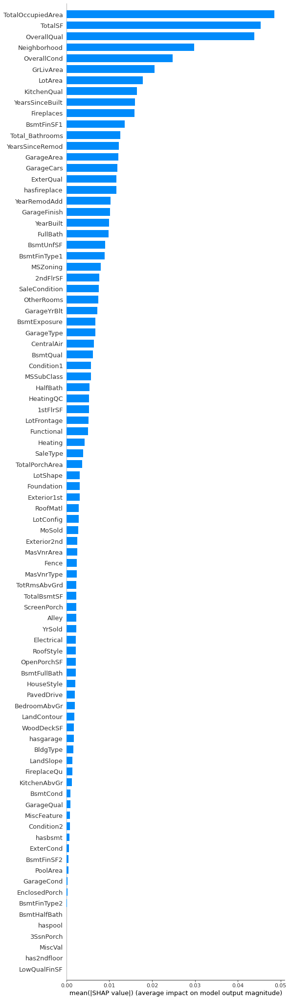

In [56]:
shap.summary_plot(shap_values, train, max_display=88,  plot_type='bar')

In [59]:
shap_sum = np.abs(shap_values).mean(axis=0)
importance_df = pd.DataFrame([train.columns.tolist(), shap_sum.tolist()]).T
importance_df.columns = ['column_name', 'shap_importance']
importance_df = importance_df.sort_values('shap_importance', ascending=False)


,column_name,shap_importance
81,TotalOccupiedArea,0.0485679
78,TotalSF,0.0453207
14,OverallQual,0.0438955
9,Neighborhood,0.0297936
15,OverallCond,0.024786
...,...,...
83,haspool,3.3482e-05
66,3SsnPorch,2.06853e-05
71,MiscVal,1.6822e-05
84,has2ndfloor,0


In [61]:
importance_df.tail(40)

,column_name,shap_importance
21,Exterior2nd,0.00250991
23,MasVnrArea,0.0024973
69,Fence,0.00245434
22,MasVnrType,0.00236664
51,TotRmsAbvGrd,0.0023394
35,TotalBsmtSF,0.00233769
67,ScreenPorch,0.00231501
4,Alley,0.00230236
73,YrSold,0.00227219
39,Electrical,0.00219893


In [68]:
drop = importance_df[importance_df['shap_importance'] < 2e-3].iloc[:,0].tolist()

['PavedDrive',
 'BedroomAbvGr',
 'LandContour',
 'WoodDeckSF',
 'hasgarage',
 'BldgType',
 'LandSlope',
 'FireplaceQu',
 'KitchenAbvGr',
 'BsmtCond',
 'GarageQual',
 'MiscFeature',
 'Condition2',
 'hasbsmt',
 'ExterCond',
 'BsmtFinSF2',
 'PoolArea',
 'GarageCond',
 'EnclosedPorch',
 'BsmtFinType2',
 'BsmtHalfBath',
 'haspool',
 '3SsnPorch',
 'MiscVal',
 'has2ndfloor',
 'LowQualFinSF']

In [70]:
train_drop = train.drop(drop, axis=1)
train_drop

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LotConfig,Neighborhood,Condition1,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,OpenPorchSF,ScreenPorch,Fence,MoSold,YrSold,SaleType,SaleCondition,YearsSinceBuilt,YearsSinceRemod,TotalSF,Total_Bathrooms,TotalPorchArea,TotalOccupiedArea,OtherRooms,hasfireplace
0,12.024057,12.024057,65.0,8450.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,7.0,5.0,2003.0,2003.0,12.024057,12.024057,12.024057,12.024057,12.024057,196.0,4.0,12.024057,4.0,1.0,6.0,706.0,150.0,856.0,12.024057,5.0,1.0,12.024057,856.0,854.0,1710.0,1.0,2.0,1.0,4.0,8.0,3.0,0.0,12.024057,2003.0,2.0,2.0,548.0,61.0,0.0,12.024057,12.024057,2008.0,12.024057,12.024057,5.0,5.0,2566.0,3.5,61.0,2627.0,4.0,0
1,12.024057,12.135878,80.0,9600.0,12.135878,12.135878,12.024057,12.024057,12.024057,12.024057,6.0,8.0,1976.0,1976.0,12.135878,12.135878,12.024057,12.024057,12.024057,0.0,3.0,12.024057,4.0,4.0,5.0,978.0,284.0,1262.0,12.135878,5.0,1.0,12.135878,1262.0,0.0,1262.0,0.0,2.0,0.0,3.0,6.0,3.0,1.0,12.135878,1976.0,2.0,2.0,460.0,0.0,0.0,12.135878,12.024057,2007.0,12.135878,12.135878,31.0,31.0,2524.0,2.5,298.0,2822.0,2.0,1
2,12.135878,12.126924,68.0,11250.0,12.126924,12.024057,12.135878,12.135878,12.135878,12.135878,7.0,5.0,2001.0,2002.0,12.126924,12.126924,12.135878,12.135878,12.135878,162.0,4.0,12.135878,4.0,2.0,6.0,486.0,434.0,920.0,12.126924,5.0,1.0,12.126924,920.0,866.0,1786.0,1.0,2.0,1.0,4.0,6.0,3.0,1.0,12.126924,2001.0,2.0,2.0,608.0,42.0,0.0,12.126924,12.024057,2008.0,12.126924,12.126924,7.0,6.0,2706.0,3.5,42.0,2748.0,2.0,1
3,12.024057,12.174486,60.0,9550.0,12.174486,12.170614,12.024057,12.024057,12.196309,12.196309,7.0,5.0,1915.0,1970.0,12.174486,12.174486,12.024057,12.024057,12.066537,0.0,3.0,12.024057,3.0,1.0,5.0,216.0,540.0,756.0,12.174486,4.0,1.0,12.174486,961.0,756.0,1717.0,1.0,1.0,0.0,4.0,7.0,3.0,1.0,12.024057,1998.0,1.0,3.0,642.0,35.0,0.0,12.174486,12.135878,2006.0,12.174486,12.024057,91.0,36.0,2473.0,2.0,307.0,2780.0,3.0,1
4,12.196309,12.109470,84.0,14260.0,12.109470,12.063544,12.066537,12.024057,12.109583,12.109583,8.0,5.0,2000.0,2000.0,12.109470,12.109470,12.196309,12.196309,12.196309,350.0,4.0,12.196309,4.0,3.0,6.0,655.0,490.0,1145.0,12.109470,5.0,1.0,12.109470,1145.0,1053.0,2198.0,1.0,2.0,1.0,4.0,9.0,3.0,1.0,12.174486,2000.0,2.0,3.0,836.0,84.0,0.0,12.109470,12.024057,2008.0,12.109470,12.174486,8.0,8.0,3343.0,3.5,276.0,3619.0,4.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,12.339817,12.085700,62.0,7917.0,12.037380,11.935212,12.001377,12.155195,12.042611,12.181883,6.0,5.0,1999.0,2000.0,11.983551,12.018883,12.205784,12.209540,11.896181,0.0,3.0,12.261595,4.0,1.0,1.0,0.0,953.0,953.0,12.031779,5.0,1.0,12.061060,953.0,694.0,1647.0,0.0,2.0,1.0,3.0,7.0,3.0,1.0,12.160876,1999.0,2.0,2.0,460.0,40.0,0.0,12.058862,12.048697,2007.0,11.990594,12.004586,8.0,7.0,2600.0,2.5,40.0,2640.0,3.0,1
1456,12.052998,12.085689,85.0,13175.0,12.037406,11.935361,12.001445,12.127453,12.042635,11.993676,6.0,6.0,1978.0,1988.0,11.983630,12.018921,12.039087,11.993124,12.423339,119.0,3.0,11.869681,4.0,1.0,5.0,790.0,589.0,1542.0,12.031808,3.0,1.0,12.061069,2073.0,0.0,2073.0,1.0,2.0,0.0,3.0,7.0,2.0,2.0,12.160774,1978.0,1.0,2.0,500.0,0.0,0.0,11.849134,12.042619,2010.0,11.990659,12.004643,32.0,22.0,3615.0,3.0,349.0,3964.0,3.0,1
1457,11.956234,12.085836,66.0,9042.0,12.037565,11.935707,12.001686,12.197467,12.042804,12.181638,7.0,9.0,1941.0,2006.0,11.983867,12.019085,12.197

In [71]:
test_drop = test.drop(drop, axis=1)
test_drop

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LotConfig,Neighborhood,Condition1,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,OpenPorchSF,ScreenPorch,Fence,MoSold,YrSold,SaleType,SaleCondition,YearsSinceBuilt,YearsSinceRemod,TotalSF,Total_Bathrooms,TotalPorchArea,TotalOccupiedArea,OtherRooms,hasfireplace
1460,12.024057,12.024057,80.0,11622.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,5.0,6.0,1961.0,1961.0,12.024057,12.024057,12.024057,12.024057,12.024057,0.0,3.0,12.024057,3.0,1.0,3.0,468.0,270.0,882.0,12.024057,3.0,1.0,12.024057,896.0,0.0,896.0,0.0,1.0,0.0,3.0,5.0,3.0,0.0,12.024057,1961.0,1.0,1.0,730.0,0.0,120.0,12.024057,12.024057,2010.0,12.024057,12.024057,49.0,49.0,1778.0,1.0,260.0,2038.0,2.0,0
1461,12.024057,12.024057,81.0,14267.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,6.0,6.0,1958.0,1958.0,12.024057,12.024057,12.024057,12.024057,12.024057,108.0,3.0,12.024057,3.0,1.0,5.0,923.0,406.0,1329.0,12.024057,3.0,1.0,12.024057,1329.0,0.0,1329.0,0.0,1.0,1.0,4.0,6.0,3.0,0.0,12.024057,1958.0,1.0,1.0,312.0,36.0,0.0,12.024057,12.024057,2010.0,12.024057,12.024057,52.0,52.0,2658.0,1.5,429.0,3087.0,2.0,0
1462,12.024057,12.024057,74.0,13830.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,5.0,5.0,1997.0,1998.0,12.024057,12.024057,12.024057,12.024057,12.024057,0.0,3.0,12.024057,4.0,1.0,6.0,791.0,137.0,928.0,12.024057,4.0,1.0,12.024057,928.0,701.0,1629.0,0.0,2.0,1.0,3.0,6.0,3.0,1.0,12.024057,1997.0,3.0,2.0,482.0,34.0,0.0,12.024057,12.024057,2010.0,12.024057,12.024057,13.0,12.0,2557.0,2.5,246.0,2803.0,2.0,1
1463,12.024057,12.024057,78.0,9978.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,6.0,6.0,1998.0,1998.0,12.024057,12.024057,12.024057,12.024057,12.024057,20.0,3.0,12.024057,3.0,1.0,6.0,602.0,324.0,926.0,12.024057,5.0,1.0,12.024057,926.0,678.0,1604.0,0.0,2.0,1.0,4.0,7.0,3.0,1.0,12.024057,1998.0,3.0,2.0,470.0,36.0,0.0,12.024057,12.024057,2010.0,12.024057,12.024057,12.0,12.0,2530.0,2.5,396.0,2926.0,3.0,1
1464,12.024057,12.024057,43.0,5005.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,8.0,5.0,1992.0,1992.0,12.024057,12.024057,12.024057,12.024057,12.024057,0.0,4.0,12.024057,4.0,1.0,5.0,263.0,1017.0,1280.0,12.024057,5.0,1.0,12.024057,1280.0,0.0,1280.0,0.0,2.0,0.0,4.0,5.0,3.0,0.0,12.024057,1992.0,2.0,2.0,506.0,82.0,144.0,12.024057,12.024057,2010.0,12.024057,12.024057,18.0,18.0,2560.0,2.0,226.0,2786.0,2.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,12.024057,12.024057,21.0,1936.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,4.0,7.0,1970.0,1970.0,12.024057,12.024057,12.024057,12.024057,12.024057,0.0,3.0,12.024057,3.0,1.0,1.0,0.0,546.0,546.0,12.024057,4.0,1.0,12.024057,546.0,546.0,1092.0,0.0,1.0,1.0,3.0,5.0,3.0,0.0,12.024057,1975.0,1.0,0.0,0.0,0.0,0.0,12.024057,12.024057,2006.0,12.024057,12.024057,36.0,36.0,1638.0,1.5,0.0,1638.0,1.0,0
2915,12.024057,12.024057,21.0,1894.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,4.0,5.0,1970.0,1970.0,12.024057,12.024057,12.024057,12.024057,12.024057,0.0,3.0,12.024057,3.0,1.0,3.0,252.0,294.0,546.0,12.024057,3.0,1.0,12.024057,546.0,546.0,1092.0,0.0,1.0,1.0,3.0,6.0,3.0,0.0,12.024057,1970.0,1.0,1.0,286.0,24.0,0.0,12.024057,12.024057,2006.0,12.024057,12.024057,36.0,36.0,1638.0,1.5,24.0,1662.0,2.0,0
2916,12.024057,12.024057,160.0,20000.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,5.0,7.0,1960.0,1996.0,12.024057

In [3]:
import joblib
train_drop = joblib.load('../input/housing/train_drop.pkl')
test_drop = joblib.load('../input/housing/test_drop.pkl')

In [5]:
import xgboost as xgb

import optuna


def objective(trial):
    dtrain = xgb.DMatrix(train_drop, label=y)

    param = {
        'seed': 20,
        'tree_method': 'gpu_hist',
        'max_depth': trial.suggest_int("max_depth", 3, 8),
        'eta' : trial.suggest_uniform("eta", 1e-3, 4e-2),
        "grow_policy": trial.suggest_categorical("grow_policy", ["depthwise", "lossguide"]),
        "gamma": trial.suggest_uniform("gamma", 1e-8, 1e-4),
        "colsample_bytree": trial.suggest_uniform("colsample_bytree", 0.1, 1.0),
        "subsample": trial.suggest_uniform("subsample", 0.3, 1.0),        
    }
    if param['grow_policy']=="lossguide":
        param['max_leaves'] =  trial.suggest_int('max_leaves',2, 32)
    bst = xgb.cv(param, dtrain, num_boost_round=5000, nfold=10, early_stopping_rounds=50,  metrics='rmse', seed=20)
    score = bst['test-rmse-mean'].tail(1).values[0]
    return score


study = optuna.create_study(direction="minimize")
study.optimize(objective, n_trials=200)
print(study.best_trial)

[I 2020-07-17 15:19:05,693] Finished trial#0 with value: 0.10554140000000001 with parameters: {'max_depth': 4, 'eta': 0.021408648669094796, 'grow_policy': 'depthwise', 'gamma': 6.239700176537591e-05, 'colsample_bytree': 0.1986607143221219, 'subsample': 0.5992055357666961}. Best is trial#0 with value: 0.10554140000000001.
[I 2020-07-17 15:19:27,579] Finished trial#1 with value: 0.10885540000000002 with parameters: {'max_depth': 5, 'eta': 0.015166836180644211, 'grow_policy': 'lossguide', 'gamma': 9.984669207015857e-05, 'colsample_bytree': 0.660844871978155, 'subsample': 0.9702803642130002, 'max_leaves': 28}. Best is trial#0 with value: 0.10554140000000001.
[I 2020-07-17 15:19:42,058] Finished trial#2 with value: 0.10860879999999999 with parameters: {'max_depth': 6, 'eta': 0.027779326392024208, 'grow_policy': 'depthwise', 'gamma': 7.110156582319867e-05, 'colsample_bytree': 0.44011409682911673, 'subsample': 0.34211439227927076}. Best is trial#0 with value: 0.10554140000000001.
[I 2020-07-1

[I 2020-07-17 15:29:35,482] Finished trial#25 with value: 0.10507910000000001 with parameters: {'max_depth': 3, 'eta': 0.010700545907186144, 'grow_policy': 'depthwise', 'gamma': 2.6331229660503714e-05, 'colsample_bytree': 0.10278520403004619, 'subsample': 0.72888610790365}. Best is trial#13 with value: 0.1049194.
[I 2020-07-17 15:29:58,939] Finished trial#26 with value: 0.1057503 with parameters: {'max_depth': 3, 'eta': 0.010420103205069005, 'grow_policy': 'depthwise', 'gamma': 1.9572083549555453e-05, 'colsample_bytree': 0.2999992993481267, 'subsample': 0.7406217108193099}. Best is trial#13 with value: 0.1049194.
[I 2020-07-17 15:30:27,621] Finished trial#27 with value: 0.1113558 with parameters: {'max_depth': 4, 'eta': 0.008862681095701553, 'grow_policy': 'lossguide', 'gamma': 8.446678119903873e-05, 'colsample_bytree': 0.37650607254640284, 'subsample': 0.8524633631643476, 'max_leaves': 2}. Best is trial#13 with value: 0.1049194.
[I 2020-07-17 15:31:03,197] Finished trial#28 with value

[I 2020-07-17 15:42:35,701] Finished trial#51 with value: 0.105276 with parameters: {'max_depth': 3, 'eta': 0.015223219263760909, 'grow_policy': 'depthwise', 'gamma': 4.637983743471742e-05, 'colsample_bytree': 0.11898271125165993, 'subsample': 0.6775300114671241}. Best is trial#13 with value: 0.1049194.
[I 2020-07-17 15:42:57,751] Finished trial#52 with value: 0.10531779999999999 with parameters: {'max_depth': 3, 'eta': 0.013719508383936412, 'grow_policy': 'depthwise', 'gamma': 2.6063917581396594e-05, 'colsample_bytree': 0.10010856171674404, 'subsample': 0.7078969221724474}. Best is trial#13 with value: 0.1049194.
[I 2020-07-17 15:43:09,251] Finished trial#53 with value: 0.10631949999999998 with parameters: {'max_depth': 3, 'eta': 0.021954365843914504, 'grow_policy': 'depthwise', 'gamma': 3.370536942341818e-05, 'colsample_bytree': 0.1399951896410144, 'subsample': 0.8151044637901114}. Best is trial#13 with value: 0.1049194.
[I 2020-07-17 15:43:29,724] Finished trial#54 with value: 0.105

[I 2020-07-17 15:52:09,210] Finished trial#77 with value: 0.10471630000000001 with parameters: {'max_depth': 3, 'eta': 0.00979101541695665, 'grow_policy': 'depthwise', 'gamma': 5.707595074254583e-05, 'colsample_bytree': 0.16659390199895074, 'subsample': 0.5858131616822785}. Best is trial#71 with value: 0.104156.
[I 2020-07-17 15:53:39,343] Finished trial#78 with value: 0.10758990000000002 with parameters: {'max_depth': 7, 'eta': 0.009517225644958046, 'grow_policy': 'depthwise', 'gamma': 4.877933912441625e-05, 'colsample_bytree': 0.34951485708201907, 'subsample': 0.5718523942071005}. Best is trial#71 with value: 0.104156.
[I 2020-07-17 15:53:56,484] Finished trial#79 with value: 0.10536130000000002 with parameters: {'max_depth': 3, 'eta': 0.016685612636832093, 'grow_policy': 'depthwise', 'gamma': 5.7901808127331804e-05, 'colsample_bytree': 0.167528627115468, 'subsample': 0.5417125083700416}. Best is trial#71 with value: 0.104156.
[I 2020-07-17 15:54:12,403] Finished trial#80 with value:

[I 2020-07-17 16:00:48,852] Finished trial#102 with value: 0.1044834 with parameters: {'max_depth': 3, 'eta': 0.013350327127766792, 'grow_policy': 'lossguide', 'gamma': 3.6293619156543784e-05, 'colsample_bytree': 0.16372552458431633, 'subsample': 0.4490679295619682, 'max_leaves': 5}. Best is trial#95 with value: 0.10390630000000001.
[I 2020-07-17 16:01:07,147] Finished trial#103 with value: 0.1039691 with parameters: {'max_depth': 3, 'eta': 0.013364693564606225, 'grow_policy': 'lossguide', 'gamma': 3.229380326877878e-05, 'colsample_bytree': 0.13947079284716316, 'subsample': 0.41677156295066836, 'max_leaves': 5}. Best is trial#95 with value: 0.10390630000000001.
[I 2020-07-17 16:01:26,319] Finished trial#104 with value: 0.1048668 with parameters: {'max_depth': 3, 'eta': 0.013528425231360053, 'grow_policy': 'lossguide', 'gamma': 3.227355581826804e-05, 'colsample_bytree': 0.10012711293358902, 'subsample': 0.4234928069981664, 'max_leaves': 5}. Best is trial#95 with value: 0.103906300000000

[I 2020-07-17 16:06:52,929] Finished trial#126 with value: 0.1062209 with parameters: {'max_depth': 3, 'eta': 0.020760307358868062, 'grow_policy': 'lossguide', 'gamma': 3.02196203459505e-05, 'colsample_bytree': 0.25154876530145326, 'subsample': 0.4352137012152565, 'max_leaves': 3}. Best is trial#110 with value: 0.10360240000000001.
[I 2020-07-17 16:07:10,384] Finished trial#127 with value: 0.10411980000000001 with parameters: {'max_depth': 3, 'eta': 0.01643485177943807, 'grow_policy': 'lossguide', 'gamma': 3.867482828212107e-05, 'colsample_bytree': 0.18722584749633062, 'subsample': 0.39741161257625157, 'max_leaves': 5}. Best is trial#110 with value: 0.10360240000000001.
[I 2020-07-17 16:07:25,390] Finished trial#128 with value: 0.1045059 with parameters: {'max_depth': 3, 'eta': 0.016420947495066278, 'grow_policy': 'lossguide', 'gamma': 3.8373261055250245e-05, 'colsample_bytree': 0.18894353952248694, 'subsample': 0.39570606937214947, 'max_leaves': 4}. Best is trial#110 with value: 0.103

[I 2020-07-17 16:13:29,581] Finished trial#149 with value: 0.104365 with parameters: {'max_depth': 3, 'eta': 0.012214840221754666, 'grow_policy': 'lossguide', 'gamma': 3.288278018472908e-05, 'colsample_bytree': 0.17846653457269634, 'subsample': 0.40351472241943576, 'max_leaves': 24}. Best is trial#110 with value: 0.10360240000000001.
[I 2020-07-17 16:13:45,329] Finished trial#150 with value: 0.10420320000000001 with parameters: {'max_depth': 3, 'eta': 0.0159224740162951, 'grow_policy': 'lossguide', 'gamma': 2.7422869101184394e-05, 'colsample_bytree': 0.15489040507079943, 'subsample': 0.4300907425763806, 'max_leaves': 6}. Best is trial#110 with value: 0.10360240000000001.
[I 2020-07-17 16:14:00,815] Finished trial#151 with value: 0.10436890000000001 with parameters: {'max_depth': 3, 'eta': 0.016241160794475015, 'grow_policy': 'lossguide', 'gamma': 2.3850998296486133e-05, 'colsample_bytree': 0.1544090287696437, 'subsample': 0.4593417909862841, 'max_leaves': 6}. Best is trial#110 with val

[I 2020-07-17 16:19:47,160] Finished trial#172 with value: 0.1050527 with parameters: {'max_depth': 3, 'eta': 0.014137904826648933, 'grow_policy': 'lossguide', 'gamma': 3.8869209077299226e-05, 'colsample_bytree': 0.1511557569981716, 'subsample': 0.371433783709913, 'max_leaves': 4}. Best is trial#110 with value: 0.10360240000000001.
[I 2020-07-17 16:20:05,462] Finished trial#173 with value: 0.1041948 with parameters: {'max_depth': 3, 'eta': 0.013023309131786379, 'grow_policy': 'lossguide', 'gamma': 4.064715946168717e-05, 'colsample_bytree': 0.17479040350869227, 'subsample': 0.3565437067813804, 'max_leaves': 5}. Best is trial#110 with value: 0.10360240000000001.
[I 2020-07-17 16:20:27,719] Finished trial#174 with value: 0.1059571 with parameters: {'max_depth': 3, 'eta': 0.012830289608259035, 'grow_policy': 'lossguide', 'gamma': 4.2505364129681486e-05, 'colsample_bytree': 0.16594630060528498, 'subsample': 0.3416789250973993, 'max_leaves': 3}. Best is trial#110 with value: 0.10360240000000

[I 2020-07-17 16:26:26,901] Finished trial#196 with value: 0.1040983 with parameters: {'max_depth': 3, 'eta': 0.015224102267171365, 'grow_policy': 'lossguide', 'gamma': 4.451791894160203e-05, 'colsample_bytree': 0.13971902822443763, 'subsample': 0.4514244754243806, 'max_leaves': 6}. Best is trial#110 with value: 0.10360240000000001.
[I 2020-07-17 16:26:42,063] Finished trial#197 with value: 0.1046367 with parameters: {'max_depth': 3, 'eta': 0.01468185081199266, 'grow_policy': 'lossguide', 'gamma': 4.3947880249918486e-05, 'colsample_bytree': 0.13478125975194188, 'subsample': 0.46036325149827756, 'max_leaves': 6}. Best is trial#110 with value: 0.10360240000000001.
[I 2020-07-17 16:26:59,083] Finished trial#198 with value: 0.10537780000000001 with parameters: {'max_depth': 3, 'eta': 0.013699462067857543, 'grow_policy': 'lossguide', 'gamma': 4.671233184275357e-05, 'colsample_bytree': 0.3956163863237617, 'subsample': 0.4461935367826109, 'max_leaves': 8}. Best is trial#110 with value: 0.1036

FrozenTrial(number=110, value=0.10360240000000001, datetime_start=datetime.datetime(2020, 7, 17, 16, 2, 51, 959172), datetime_complete=datetime.datetime(2020, 7, 17, 16, 3, 9, 881633), params={'max_depth': 3, 'eta': 0.01423912926193527, 'grow_policy': 'lossguide', 'gamma': 2.804584764149306e-05, 'colsample_bytree': 0.2403604834036041, 'subsample': 0.38141269740154965, 'max_leaves': 6}, distributions={'max_depth': IntUniformDistribution(high=8, low=3, step=1), 'eta': UniformDistribution(high=0.04, low=0.001), 'grow_policy': CategoricalDistribution(choices=('depthwise', 'lossguide')), 'gamma': UniformDistribution(high=0.0001, low=1e-08), 'colsample_bytree': UniformDistribution(high=1.0, low=0.1), 'subsample': UniformDistribution(high=1.0, low=0.3), 'max_leaves': IntUniformDistribution(high=32, low=2, step=1)}, user_attrs={}, system_attrs={}, intermediate_values={}, trial_id=110, state=TrialState.COMPLETE)


In [ ]:
Finished trial#110 with 
value: 0.1036024 with parameters: {'max_depth': 3, 'eta': 0.01423912926193527, 'grow_policy': 'lossguide', 'gamma': 2.804584764149306e-05, 
                                             'colsample_bytree': 0.2403604834036041, 'subsample': 0.38141269740154965, 'max_leaves': 6}.

In [ ]:
Finished trial#92 with 
value: 0.1035468 with parameters: {'max_depth': 5, 'eta': 0.013756693975876696, 'grow_policy': 'lossguide', 
                                             'colsample_bytree': 0.20138587742787276, 'subsample': 0.4247921815753497, 'max_leaves': 11}

In [ ]:
Finished trial#75 with 
value: 0.1043331 with parameters: 
{'max_depth': 3, 'eta': 0.01337736610666032, 'gamma': 8.187276373029823e-05, 
'colsample_bytree': 0.27923382056500784, 'subsample': 0.3363713170942075}.

In [6]:
import joblib
joblib.dump(study, 'study.pkl')

['study.pkl']

In [129]:
test_drop

,MSSubClass,MSZoning,LotFrontage,LotArea,Alley,LotShape,LotConfig,Neighborhood,Condition1,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,Foundation,BsmtQual,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,GrLivArea,BsmtFullBath,FullBath,HalfBath,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,OpenPorchSF,ScreenPorch,Fence,MoSold,YrSold,SaleType,SaleCondition,YearsSinceBuilt,YearsSinceRemod,TotalSF,Total_Bathrooms,TotalPorchArea,TotalOccupiedArea,OtherRooms,hasfireplace
1460,12.024057,12.024057,80.0,11622.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,5.0,6.0,1961.0,1961.0,12.024057,12.024057,12.024057,12.024057,12.024057,0.0,3.0,12.024057,3.0,1.0,3.0,468.0,270.0,882.0,12.024057,3.0,1.0,12.024057,896.0,0.0,896.0,0.0,1.0,0.0,3.0,5.0,3.0,0.0,12.024057,1961.0,1.0,1.0,730.0,0.0,120.0,12.024057,12.024057,2010.0,12.024057,12.024057,49.0,49.0,1778.0,1.0,260.0,2038.0,2.0,0
1461,12.024057,12.024057,81.0,14267.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,6.0,6.0,1958.0,1958.0,12.024057,12.024057,12.024057,12.024057,12.024057,108.0,3.0,12.024057,3.0,1.0,5.0,923.0,406.0,1329.0,12.024057,3.0,1.0,12.024057,1329.0,0.0,1329.0,0.0,1.0,1.0,4.0,6.0,3.0,0.0,12.024057,1958.0,1.0,1.0,312.0,36.0,0.0,12.024057,12.024057,2010.0,12.024057,12.024057,52.0,52.0,2658.0,1.5,429.0,3087.0,2.0,0
1462,12.024057,12.024057,74.0,13830.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,5.0,5.0,1997.0,1998.0,12.024057,12.024057,12.024057,12.024057,12.024057,0.0,3.0,12.024057,4.0,1.0,6.0,791.0,137.0,928.0,12.024057,4.0,1.0,12.024057,928.0,701.0,1629.0,0.0,2.0,1.0,3.0,6.0,3.0,1.0,12.024057,1997.0,3.0,2.0,482.0,34.0,0.0,12.024057,12.024057,2010.0,12.024057,12.024057,13.0,12.0,2557.0,2.5,246.0,2803.0,2.0,1
1463,12.024057,12.024057,78.0,9978.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,6.0,6.0,1998.0,1998.0,12.024057,12.024057,12.024057,12.024057,12.024057,20.0,3.0,12.024057,3.0,1.0,6.0,602.0,324.0,926.0,12.024057,5.0,1.0,12.024057,926.0,678.0,1604.0,0.0,2.0,1.0,4.0,7.0,3.0,1.0,12.024057,1998.0,3.0,2.0,470.0,36.0,0.0,12.024057,12.024057,2010.0,12.024057,12.024057,12.0,12.0,2530.0,2.5,396.0,2926.0,3.0,1
1464,12.024057,12.024057,43.0,5005.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,8.0,5.0,1992.0,1992.0,12.024057,12.024057,12.024057,12.024057,12.024057,0.0,4.0,12.024057,4.0,1.0,5.0,263.0,1017.0,1280.0,12.024057,5.0,1.0,12.024057,1280.0,0.0,1280.0,0.0,2.0,0.0,4.0,5.0,3.0,0.0,12.024057,1992.0,2.0,2.0,506.0,82.0,144.0,12.024057,12.024057,2010.0,12.024057,12.024057,18.0,18.0,2560.0,2.0,226.0,2786.0,2.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2914,12.024057,12.024057,21.0,1936.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,4.0,7.0,1970.0,1970.0,12.024057,12.024057,12.024057,12.024057,12.024057,0.0,3.0,12.024057,3.0,1.0,1.0,0.0,546.0,546.0,12.024057,4.0,1.0,12.024057,546.0,546.0,1092.0,0.0,1.0,1.0,3.0,5.0,3.0,0.0,12.024057,1975.0,1.0,0.0,0.0,0.0,0.0,12.024057,12.024057,2006.0,12.024057,12.024057,36.0,36.0,1638.0,1.5,0.0,1638.0,1.0,0
2915,12.024057,12.024057,21.0,1894.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,4.0,5.0,1970.0,1970.0,12.024057,12.024057,12.024057,12.024057,12.024057,0.0,3.0,12.024057,3.0,1.0,3.0,252.0,294.0,546.0,12.024057,3.0,1.0,12.024057,546.0,546.0,1092.0,0.0,1.0,1.0,3.0,6.0,3.0,0.0,12.024057,1970.0,1.0,1.0,286.0,24.0,0.0,12.024057,12.024057,2006.0,12.024057,12.024057,36.0,36.0,1638.0,1.5,24.0,1662.0,2.0,0
2916,12.024057,12.024057,160.0,20000.0,12.024057,12.024057,12.024057,12.024057,12.024057,12.024057,5.0,7.0,1960.0,1996.0,12.024057

In [131]:
joblib.dump(test_drop, 'test_drop.pkl')

['test_drop.pkl']

In [2]:
import joblib
study = joblib.load('../input/study-for-houses/study(1).pkl')